**Machine Problem: Object Detection and Recognition using YOLO**

# Import Libraries


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load YOLO Model


In [ ]:
# Load class labels from coco.names
with open('/content/coco.names', 'r') as f:
    classes = [line.strip() for line in f.readlines()]

# Load YOLO model
net = cv2.dnn.readNet('/content/yolov3.weights', '/content/yolov3.cfg')
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]

# Image Input


In [ ]:
image_paths = ['/content/img1.jpg', '/content/img2.jpg', '/content/img3.jpg']

# Object Detection


Detections for /content/img1.jpg:


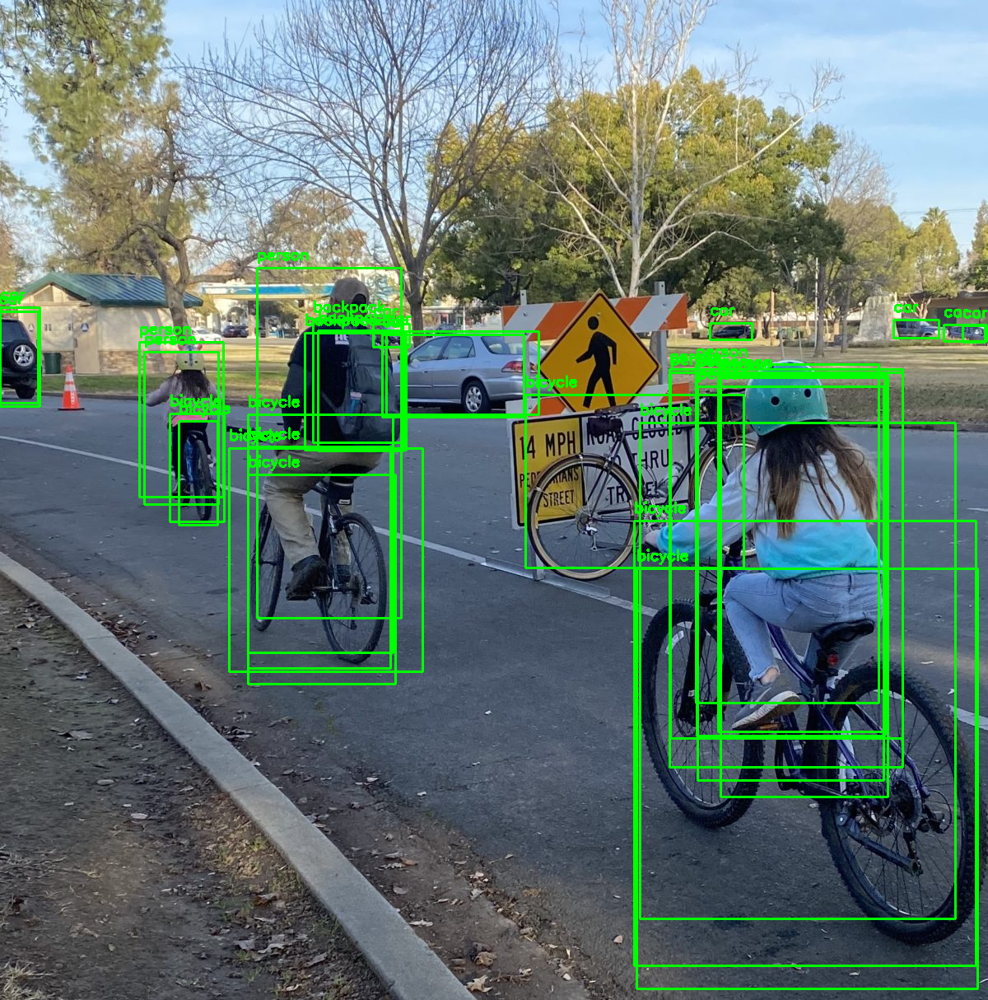

Detections for /content/img2.jpg:


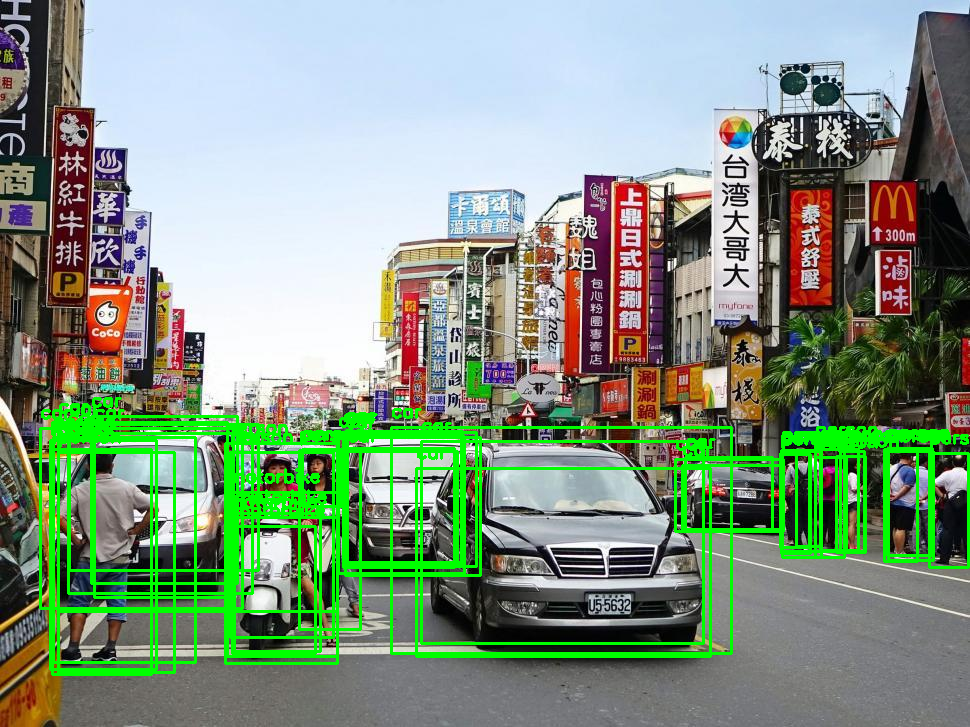

Detections for /content/img3.jpg:


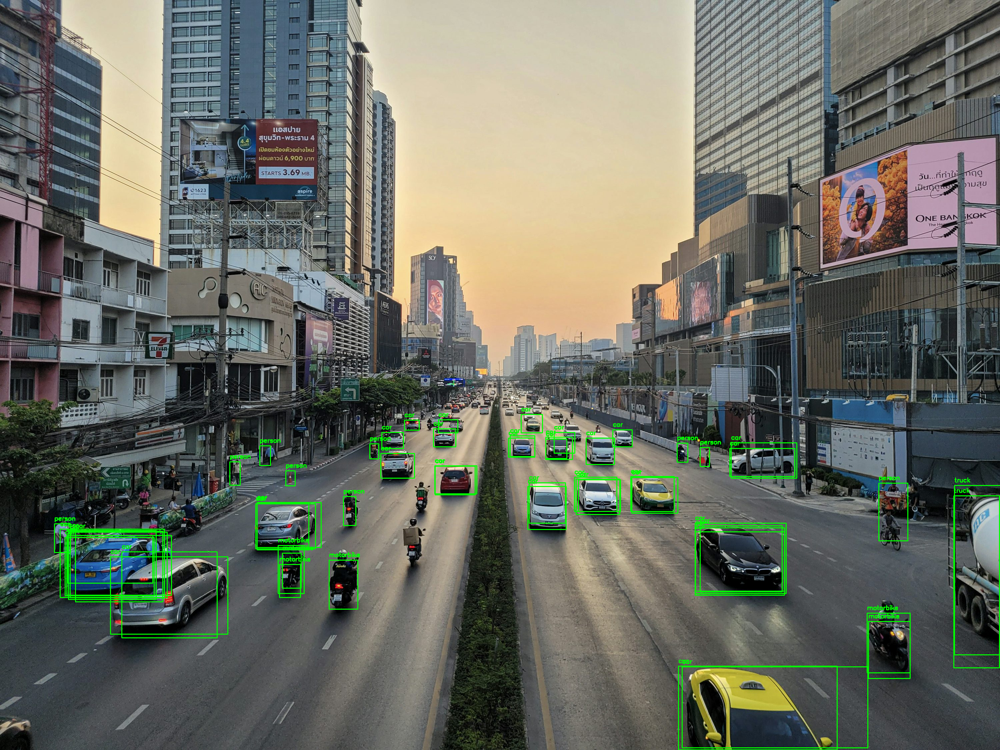

In [ ]:
# Loop through each image
for image_path in image_paths:
    # Load image
    img = cv2.imread(image_path)
    height, width, channels = img.shape

    # Prepare the image as input for the model
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Process detections
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                # Get label and draw bounding box with label text
                label = str(classes[class_id])
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
                cv2.putText(img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Display the image with detections
    print(f"Detections for {image_path}:")
    cv2_imshow(img)
    cv2.waitKey(0)

cv2.destroyAllWindows()

# Downloads

In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names


--2024-11-02 10:45:02--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  40.9MB/s    in 7.7s    

2024-11-02 10:45:10 (30.7 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]

--2024-11-02 10:45:10--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8342 (8.1K) [text/plain]
Saving to: ‘yolov3.cfg’

yolov3.cfg          100%[===================>]   8.15K  --.-KB/s    in 0s      

2